In [1]:
using JLD2
using StatsBase
using Plots
#backend(:plotly)
using DataFrames
using CSV

In [2]:
function dataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 3, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #df = df[!, [6, 9, 2, 3, 7, 8, 10, 4, 5, 1]] #used for when sorting by pn/r
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    #print(dataArr)
    dataArr
end

function hmap(data::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataRead(data, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range #PNC/PND times 10
        push!(x_axis, (string(round((0.4*i/range); digits = 4))))
        push!(y_axis, (string(round((10*i/range); digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, xlabel="CL",ylabel="BEN", clim=(cLow,chI))
    p
end

hmap (generic function with 1 method)

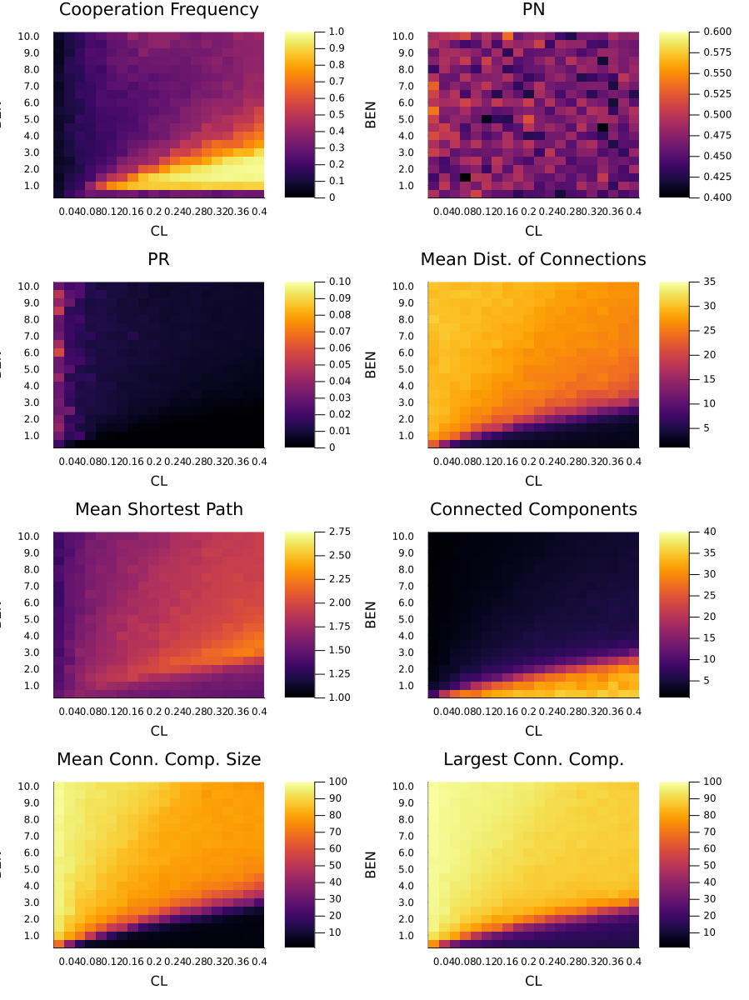

In [3]:
file = "dist_inherit_no_pnd_aug_22.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PN", 0.4, 0.6), 
hmap(file, 20, 8, "PR", 0.0, 0.1),
hmap(file, 20, 14, "Mean Dist. of Connections", 1.0, 35.0),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 2.75), 
hmap(file, 20, 11, "Connected Components", 1.0, 40.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 1.0, 100.0),
]

plot(fig1hmaps..., colorbar = true, grid=false, layout = (4,2), size = (900, 1200)) 

**Figure 1** The results above were created with: B=pard["ben"], C=0.5, D=0.0, CL=pard["cl"], gen=100000, distInherit=true, distFactor=0.95, pn=0.5, pnd=false, pr=0.0001, prd=false, muP=0.001, delta=0.1, sigmapn=0.01, sigmapr=0.01, reps=10). Initial cooperation frequency was 0.5 . File name: "dist_inherit_no_pnd_aug_22.csv"

# Heatmap for Iteration by clratio and distFactor

In [4]:
function dataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 6, 4, 5, 8, 13, 14, 15, 16, 17, 3, 11, 10, 12, 7, 9, 1]] #used for soring by clratio/distFactor, including graphCalcs
    #df = df[!, [2, 3, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:clratio , :distFactor])
    #print(df)
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    #print(dataArr)
    dataArr
end

function hmap(data::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataRead(data, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range 
        push!(x_axis, (string(round((0.75+0.25*i/range); digits = 2)))) 
        push!(y_axis, (string(round((0.02/(0.04*i/range)); digits = 3))*"/"*string(round((10.0*0.04*i/range); digits = 2))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, ylabel="BEN/CL",xlabel="DistFactor", clim=(cLow,chI))
    p
end

hmap (generic function with 1 method)

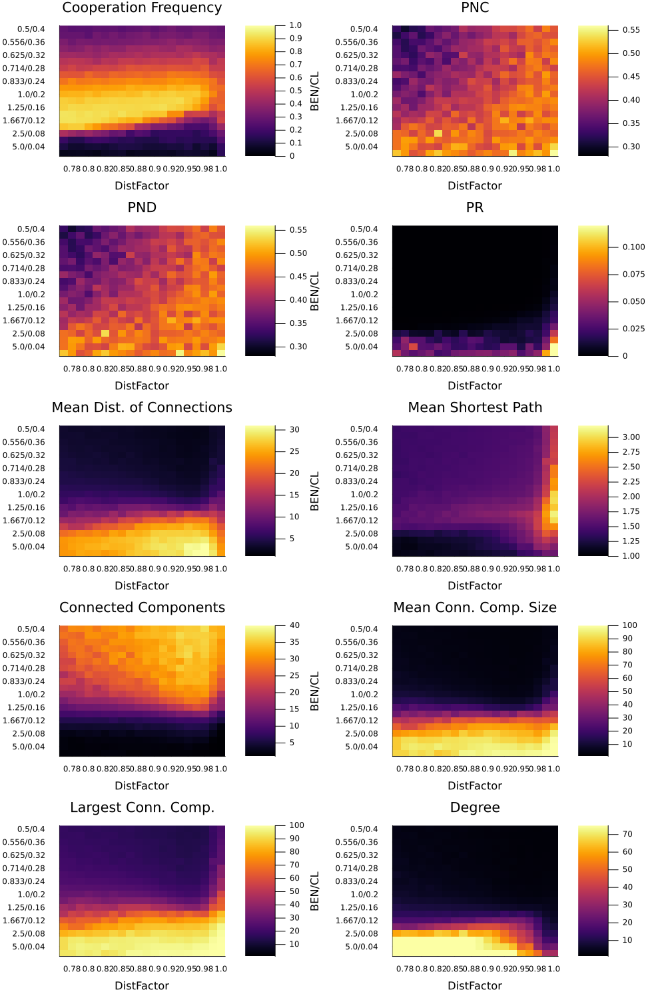

In [5]:
file = "fig_3_dist_no_pnd.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PNC", 0.28, 0.56), 
hmap(file, 20, 7, "PND", 0.28, 0.56), 
hmap(file, 20, 8, "PR", 0.0, 0.12),
hmap(file, 20, 14, "Mean Dist. of Connections", 1.0, 31.0),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 3.2), 
hmap(file, 20, 11, "Connected Components", 1.0, 40.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 1.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 75.0)
]
#,

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

**Figure 2** Heatmaps for various metrics with a fixen ben/cl product and varying distFactor and without pnd or prd evolving separately

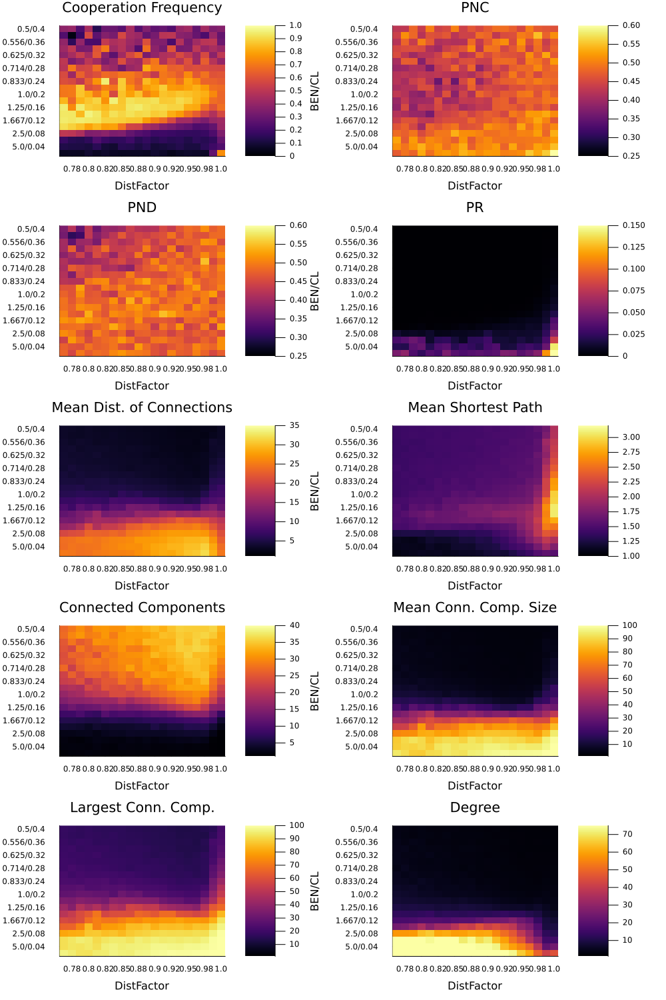

In [6]:
file = "fig_3_dist_pnd.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PNC", 0.25, 0.6), 
hmap(file, 20, 7, "PND", 0.25, 0.6), 
hmap(file, 20, 8, "PR", 0.0, 0.15),
hmap(file, 20, 14, "Mean Dist. of Connections", 1.0, 35.0),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 3.2), 
hmap(file, 20, 11, "Connected Components", 1.0, 40.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 1.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 75.0)
]
#,

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

**Figure 3** Heatmaps for various metrics with a fixen ben/cl product and varying distFactor and with pnd but not prd evolving separately

**Heatmap for Smaller ben/cl range**

In [7]:
function dataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 6, 4, 5, 8, 13, 14, 15, 16, 17, 3, 11, 10, 12, 7, 9, 1]] #used for soring by clratio/distFactor, including graphCalcs
    #df = df[!, [2, 3, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:cl , :distFactor])
    #print(df)
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    #print(dataArr)
    dataArr
end

function hmap(data::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataRead(data, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range 
        push!(x_axis, (string(round(0.5+0.5*i/range; digits = 2))))
        push!(y_axis, (string(round(0.4*i/range; digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, ylabel="CL",xlabel="DistFactor", clim=(cLow,chI))
    p
end

hmap (generic function with 1 method)

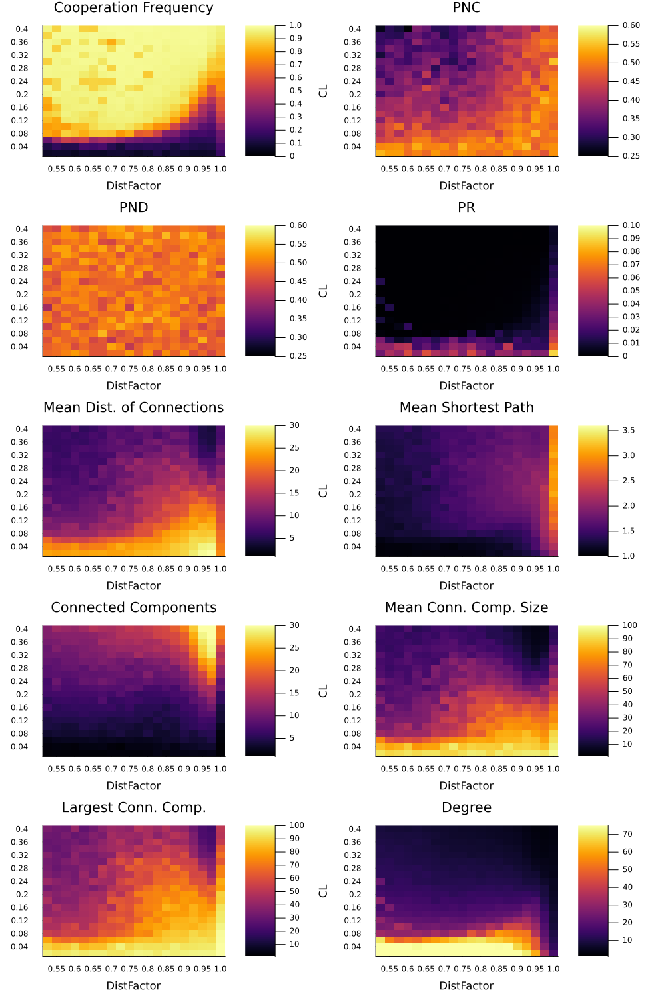

In [8]:
file = "dist_small_range_pnd.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PNC", 0.25, 0.6), 
hmap(file, 20, 7, "PND", 0.25, 0.6), 
hmap(file, 20, 8, "PR", 0.0, 0.10),
hmap(file, 20, 14, "Mean Dist. of Connections", 1.0, 30.0),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 3.6), 
hmap(file, 20, 11, "Connected Components", 1.0, 30.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 1.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 75.0)
]
#,

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

**Figure 4.** The results above were created with: B=2.0, C=0.5, D=0.0, CL=pard["cl"], gen=100000, distInherit=true, distFactor=pard["distFactor"], pn=0.5, pnd=true, pr=0.0001, prd=false, muP=0.001, delta=0.1, sigmapn=0.01, sigmapr=0.01, reps=10). Initial cooperation frequency was 0.5 . File name: "dist_small_range_pnd.csv". The y-axis caption above is incorrect--it should just be CL, not BEN/CL. 


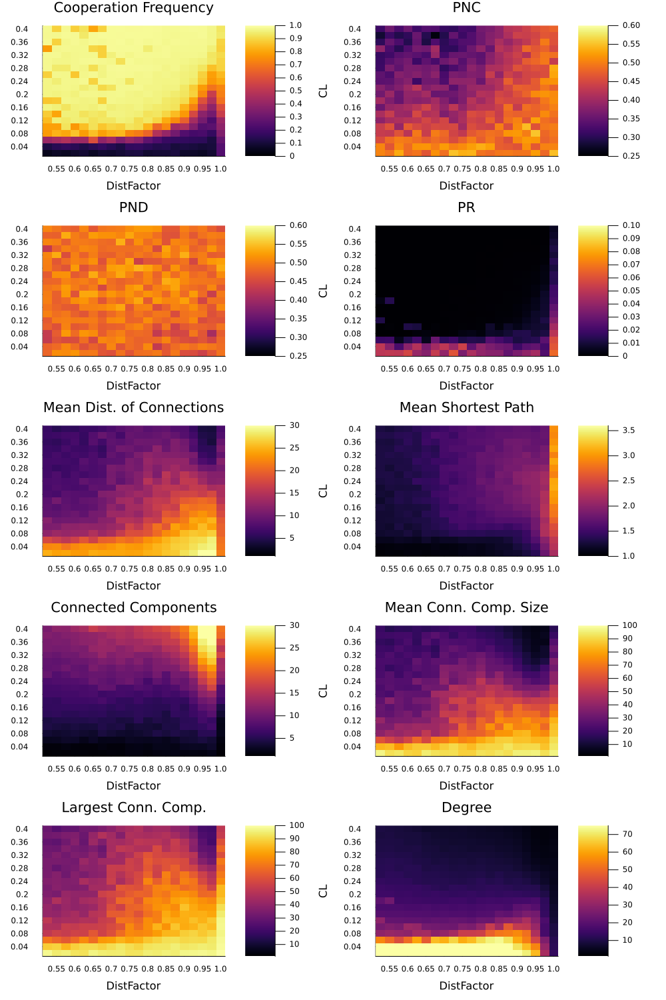

In [9]:
file = "dist_small_range_no_pnd.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PNC", 0.25, 0.6), 
hmap(file, 20, 7, "PND", 0.25, 0.6), 
hmap(file, 20, 8, "PR", 0.0, 0.10),
hmap(file, 20, 14, "Mean Dist. of Connections", 1.0, 30.0),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 3.6), 
hmap(file, 20, 11, "Connected Components", 1.0, 30.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 1.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 75.0)
]
#,

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

**Figure 5.** The results above were created with: B=2.0, C=0.5, D=0.0, CL=pard["cl"], gen=100000, distInherit=true, distFactor=pard["distFactor"], pn=0.5, pnd=false, pr=0.0001, prd=false, muP=0.001, delta=0.1, sigmapn=0.01, sigmapr=0.01, reps=10). Initial cooperation frequency was 0.5 . File name: "dist_small_range_pnd.csv". The y-axis caption above is incorrect--it should just be CL, not BEN/CL. 


# Heatmap for Iterating by ben/cl

In [10]:
function dataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 3, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #df = df[!, [6, 9, 2, 3, 7, 8, 10, 4, 5, 1]] #used for when sorting by pn/r
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    #print(dataArr)
    dataArr
end

function hmap(data::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataRead(data, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range #PNC/PND times 10
        push!(x_axis, (string(round((0.4*i/range); digits = 4))))
        push!(y_axis, (string(round((10*i/range); digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, xlabel="CL",ylabel="BEN", clim=(cLow,chI))
    p
end

#redefined hmap() in between runs


hmap (generic function with 1 method)

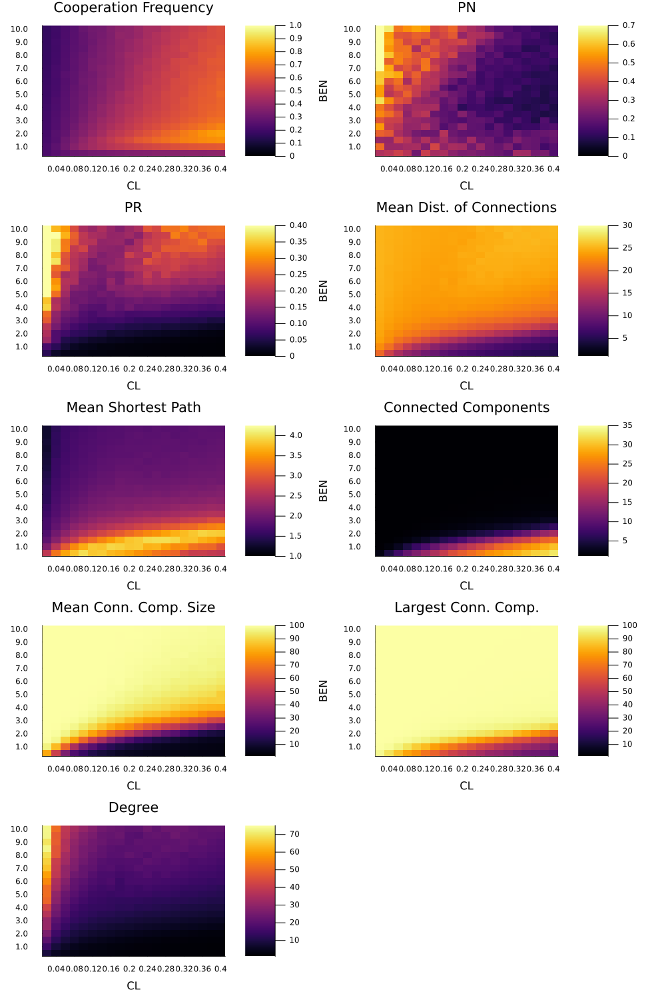

In [11]:
file = "neighbor_mom_no_pnd_fixed.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PN", 0.0, 0.7), 
hmap(file, 20, 8, "PR", 0.0, 0.40),
hmap(file, 20, 14, "Mean Dist. of Connections", 1.0, 30.0),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 4.25), 
hmap(file, 20, 11, "Connected Components", 1.0, 35.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 1.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 75.0)
]
#,

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

**Figure 6** The results above were created with: B=pard["ben"], C=0.5, D=0.0, CL=pard["cl"], gen=100000, distInherit=false, distFactor=1.0, pn=0.5, findMom=neighborMom, pnd=false, pr=0.0001, prd=false, muP=0.01, delta=0.5, sigmapn=0.01, sigmapr=0.01, reps=10). Initial cooperation frequency was 0.5 . File name: "neighbor_mom_no_pnd_fixed.csv"


# Fixed Dist Inherit

In [12]:
function dataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 3, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #df = df[!, [6, 9, 2, 3, 7, 8, 10, 4, 5, 1]] #used for when sorting by pn/r
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    #print(dataArr)
    dataArr
end

function hmap(data::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataRead(data, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range #PNC/PND times 10
        push!(x_axis, (string(round((0.4*i/range); digits = 4))))
        push!(y_axis, (string(round((10*i/range); digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, xlabel="CL",ylabel="BEN", clim=(cLow,chI))
    p
end

#redefined hmap() in between runs


hmap (generic function with 1 method)

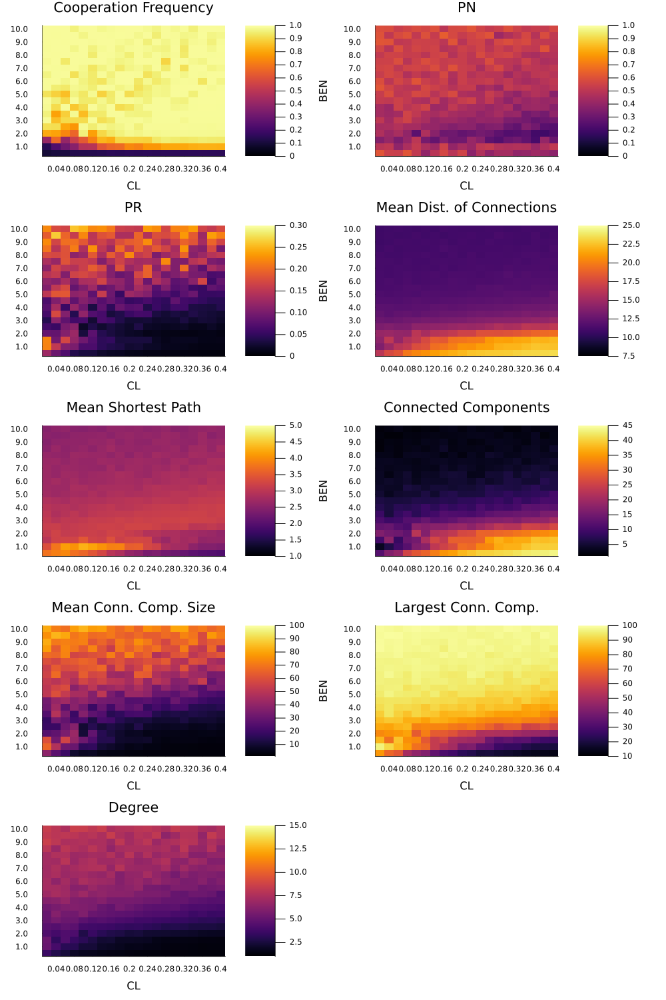

In [13]:
file = "d_inherit_no_pnd_test.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PN", 0.0, 1.0), 
hmap(file, 20, 8, "PR", 0.0, 0.3),
hmap(file, 20, 14, "Mean Dist. of Connections", 7.5, 25.0),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 5.0), 
hmap(file, 20, 11, "Connected Components", 1.0, 45.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 10.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 15.0)] 

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

The results above were created with: B=pard["ben"], C=0.5, D=0.0, CL=pard["cl"], gen=100000, dbOrder=deathbirth, distInherit=true, distFactor=0.9, findMom=anyMom, pn=0.5, pnd=false, pr=0.0001, prd=false, muP=0.01, delta=0.5, sigmapn=0.01, sigmapr=0.01, reps=10) Initial cooperation frequency was 0.5 . File name:  "d_inherit_no_pnd_test.csv"

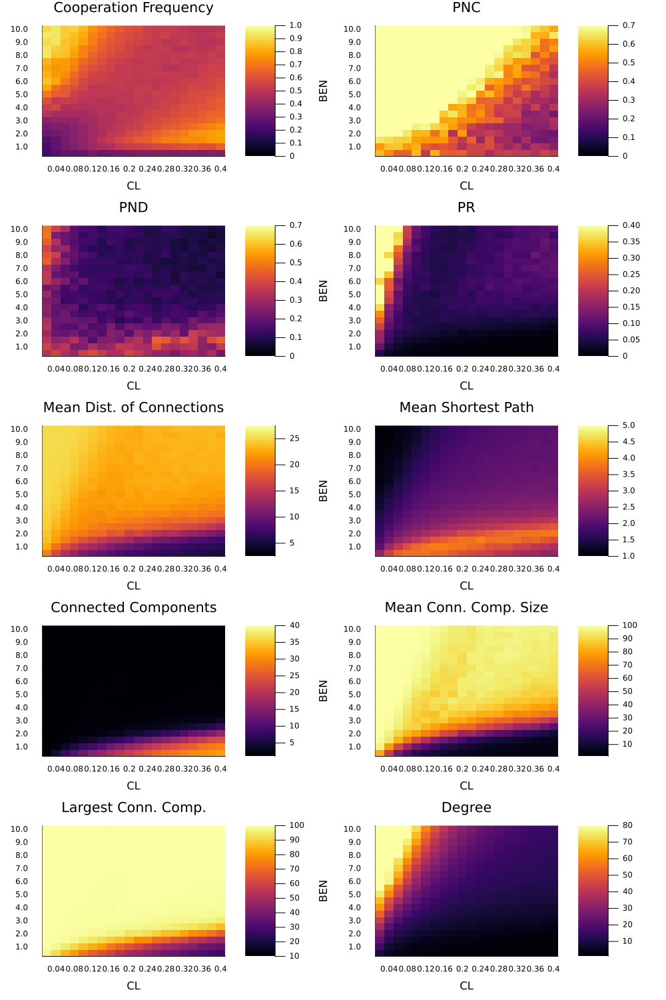

In [14]:
file =  "fixed_connDist_nmom_pnd.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PNC", 0.0, 0.7), 
hmap(file, 20, 7, "PND", 0.0, 0.7), 
hmap(file, 20, 8, "PR", 0.0, 0.4),
hmap(file, 20, 14, "Mean Dist. of Connections", 2.5, 27.5),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 5.0), 
hmap(file, 20, 11, "Connected Components", 1.0, 40.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 10.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 80.0)] 

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

The results above were created with: B=pard["ben"], C=0.5, D=0.0, CL=pard["cl"], gen=100000, dbOrder=deathbirth, distInherit=false, distFactor=1.0, findMom=neighborMom, pn=0.5, pnd=true, pr=0.0001, prd=false, muP=0.01, delta=0.5, sigmapn=0.01, sigmapr=0.01, reps=10)  Initial cooperation frequency was 0.5 . File name:  "fixed_connDist_nmom_pnd.csv"

Heatmap for iterating by distFactor/cl (old)

In [15]:
function dataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 6, 4, 5, 8, 13, 14, 15, 16, 17, 3, 11, 10, 12, 7, 9, 1]] #used for soring by clratio/distFactor/distNeighborRange, including graphCalcs
    sort!(df, [:distFactor, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    dataArr
end

function hmap(data::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataRead(data, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range 
        push!(y_axis, (string(round(0.5+0.5*i/range; digits = 3)))) 
        push!(x_axis, (string(round(0.4*i/range; digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, xlabel="CL",ylabel="DistFactor", clim=(cLow,chI))
    p
end

hmap (generic function with 1 method)

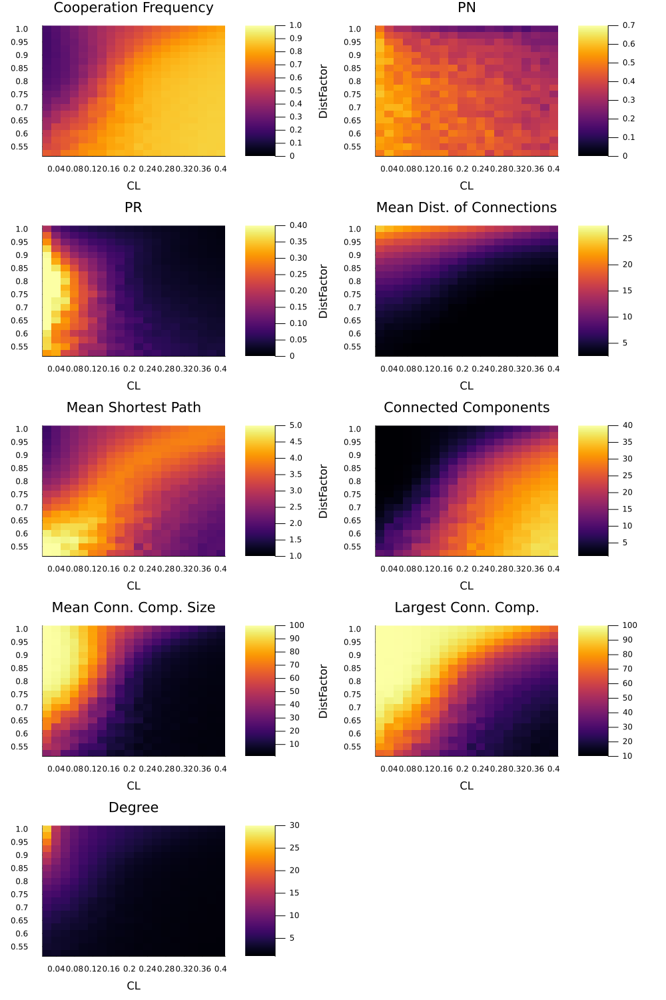

In [16]:
file =  "distInherit_nmon_no_pnd.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PN", 0.0, 0.7), 
hmap(file, 20, 8, "PR", 0.0, 0.4),
hmap(file, 20, 14, "Mean Dist. of Connections", 2.5, 27.5),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 5.0), 
hmap(file, 20, 11, "Connected Components", 1.0, 40.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 10.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 30.0)] 

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 

The results above were created with: B=2.0, C=0.5, D=0.0, CL=pard["cl"], gen=100000, dbOrder=deathbirth, distInherit=true, distFactor=pard["distFactor"], findMom=neighborMom, pn=0.5, pnd=false, pr=0.0001, prd=false, muP=0.01, delta=0.5, sigmapn=0.01, sigmapr=0.01, reps=10).  Initial cooperation frequency was 0.5 . File name:  "distInherit_nmon_no_pnd.csv"

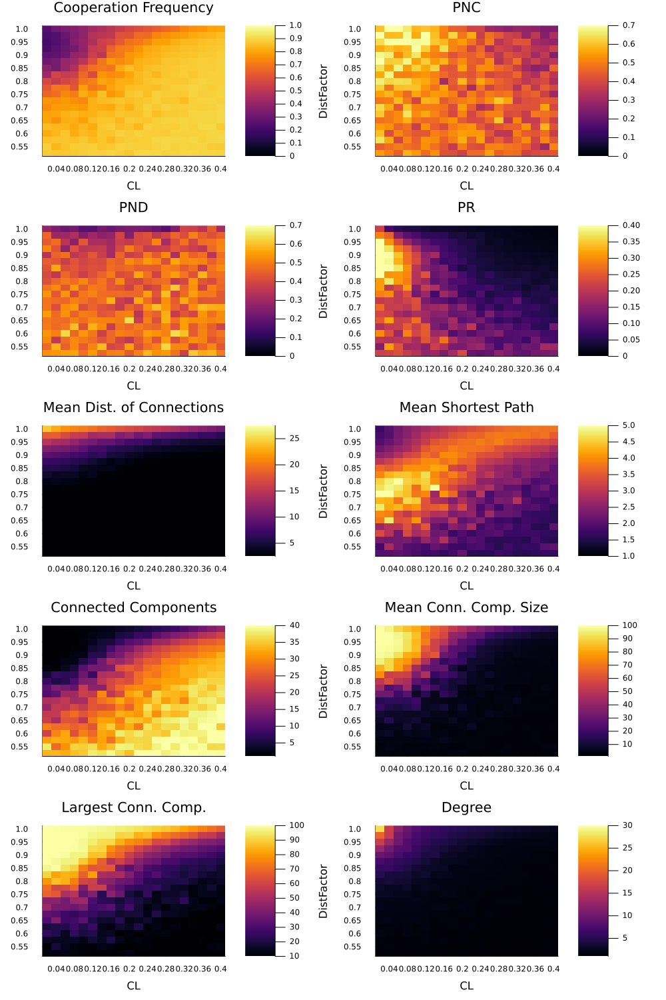

In [17]:
file =  "distInherit_nmon_pnd.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PNC", 0.0, 0.7), 
hmap(file, 20, 7, "PND", 0.0, 0.7), 
hmap(file, 20, 8, "PR", 0.0, 0.4),
hmap(file, 20, 14, "Mean Dist. of Connections", 2.5, 27.5),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 5.0), 
hmap(file, 20, 11, "Connected Components", 1.0, 40.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 10.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 30.0)] 

plot(fig1hmaps..., colorbar = true, grid=false, layout = (5,2), size = (1000, 1500)) 


The results above were created with: B=2.0, C=0.5, D=0.0, CL=pard["cl"], gen=100000, dbOrder=deathbirth, distInherit=true, distFactor=pard["distFactor"], findMom=neighborMom, pn=0.5, pnd=true, pr=0.0001, prd=false, muP=0.01, delta=0.5, sigmapn=0.01, sigmapr=0.01, reps=10).  Initial cooperation frequency was 0.5 . File name:  "distInherit_nmon_pnd.csv"